# Any Trigger Analysis

For the distribution of events received from each paddle end:

Number of Events received:
- print out a warning if a channel is showing no events, which I think is the most likely way for a problem to manifest. Alternative/stricter check: print out a warning if a paddle end has less than 50% of the avg number of events per channel? Or less than 50% of the max number of events per channel?
- print out the number of events per channel *visual inspection*

Pedestal:
- print warning if the avg value of pedRMS calculated is greater than 0.7
- print warning if the standard deviation of the pedestal value calculated is greater than 0.7
- print warning if pedestal value distribution has more than 2% outliers

Charge:
- Make a cut at 5pC and check that the average value of this charge distribution is greater than 14pC
- print number of events which pass 5pC cut *visual inspection*
- Plot QEnd2End for each paddle, visually inspect for dead channels by searching for plots hugging either axis or the origin *visual inspection required*


# Import Packages

In [1]:
import gaps_online as go
import matplotlib.pyplot as plt
import numpy as np
import os
import json

HDF converter tools not available! No module named 'h5py'


In [2]:
fig = plt.figure(1)
# change the fonts
plt.rc('font',family='serif')
plt.rcParams['mathtext.fontset'] = 'custom'
plt.rcParams['mathtext.rm'] = 'serif'
plt.rcParams['mathtext.it'] = 'serif:italic'
plt.rcParams['mathtext.bf'] = 'serif:bold'
plt.rcParams['font.size'] = 12.5
plt.rcParams['axes.linewidth'] = 1

def plotroot(dat, x1, x2, xlab, ylab, title, ylim, xlo=0, log=False):

    fig,ax = plt.subplots(figsize=(9,7))

    # define the bins; 100 evenly spaced between -5 and 5
    bins = np.linspace(x1,x2,100)
    
    # plot the data, using our bin edges
    plt.hist(dat,bins,histtype="step",color="blue")

    # Make a box of parameters in the top right
    bboxd = dict(boxstyle="square", facecolor="w")
    nentries = len(dat)
    mu = np.mean(dat)
    sigma = np.std(dat-mu)
    tbtext = ("Entries   {0:d}\n".format(nentries) + "Mean   {0:.3f}\n".format(mu) + "RMS   {0:.5f}".format(sigma))
    plt.text(.9, 1., tbtext, transform=ax.transAxes, fontsize=10, verticalalignment="top", horizontalalignment="center", bbox=bboxd)

    # Label axes and graph title
    plt.xlabel(xlab)
    plt.ylabel(ylab)
    plt.title(title)
    
    if log:
        plt.yscale("log")

    # Change ticks on axes
    ax.minorticks_on()
    ax.tick_params(axis="both",which="both",direction="in")

    # Set x-axis limits
    plt.xlim(xlo,x2)
    plt.ylim(0,ylim)

    # Efficiently use 5 x 5 space
    plt.tight_layout()
    #plt.savefig(title + ".png")
    plt.show()

<Figure size 640x480 with 0 Axes>

# Load Files

## Calibration Dictionary

In [10]:
# RBs in the entire TOF
#files = ["01", "02", "03", "04", "05", "06", "07", "08", "09", "11", "13", "14", "15", "16", "17", "18", "19", "20", "21", "22", "23", "24", "25", "26", "27", "28", "29", "30", "31", "32", "33", "34", "35", "36", "39", "40", "41", "42", "44", "46"]

# RBs in the umbrella
files = ["03", "13", "14", "15", "21", "23", "24", "27", "29", "31", "32", "35"]
cals = []
keys = []


caldir = "/home/gaps/csbf-data/calib/20240525/"
filename = sorted(os.listdir(caldir))  #[-40:]

for ind in range(len(files)):

    print(filename[ind])

    cali = go.cxx_api.RBCalibration.from_file(caldir + filename[ind])
    #cali = go.rust_api.events.RBCalibration()
    #cali.from_file(caldir + filename[ind])

    keys.append(cali.rb_id)
    cals.append(cali)

cal_dict = dict(zip(keys, cals))


RB03_240525_232633UTC.cali.tof.gaps
RB13_240525_232635UTC.cali.tof.gaps
RB14_240525_232635UTC.cali.tof.gaps
RB15_240525_232635UTC.cali.tof.gaps
RB21_240525_232635UTC.cali.tof.gaps
RB23_240525_232636UTC.cali.tof.gaps
RB24_240525_232632UTC.cali.tof.gaps
RB27_240525_232635UTC.cali.tof.gaps
RB29_240525_232634UTC.cali.tof.gaps
RB31_240525_232633UTC.cali.tof.gaps
RB32_240525_232635UTC.cali.tof.gaps
RB35_240525_232635UTC.cali.tof.gaps


## Find Run Files

In [7]:
rundir = "/home/gaps/csbf-data/11/"

run = sorted(os.listdir(rundir))[:-1]

run

['Run11_0.240527_175427+0000.tof.gaps',
 'Run11_1.240527_175616+0000.tof.gaps',
 'Run11_2.240527_175753+0000.tof.gaps',
 'Run11_3.240527_175932+0000.tof.gaps',
 'Run11_4.240527_180111+0000.tof.gaps',
 'Run11_5.240527_180249+0000.tof.gaps',
 'Run11_6.240527_180427+0000.tof.gaps']

In [29]:
len(run)

483

## Create Map from RBid+Ch -> Paddle End File

paddmap is a dictionary.

    keys: strings rbid, ch
    value: 4 digit integer representing Paddle End
        - vals > than 2000 are end B
        - vals between 1000 and 2000 are end A
        - val%1000 are paddIDs

paddIDs between 61 and 108 inclusive are in the Umbrella

In [19]:
# might need to copy this json file to whatever machine we are running on

json_paddmap_file = '/home/gaps/software/gaps-online-software/src-LELEWAA-0.10/gaps-db/resources/master-spreadsheet/rbch-vs-paddle.json'

with open(json_paddmap_file) as json_file:
    paddmap = json.load(json_file)

## Create Ped, QInt Dicts

indexed by RBid, Ch

In [23]:
peds = []
pedrms = []

for key in keys:

    peds.append([[],[],[],[],[],[],[],[]])
    pedrms.append([[],[],[],[],[],[],[],[]])

ped_dict = dict(zip(keys, peds))
pedrms_dict = dict(zip(keys, pedrms))

In [24]:
Qint = []

for key in keys:

    Qint.append([[],[],[],[],[],[],[],[]])

Q_dict = dict(zip(keys, Qint))

In [25]:
Qint_cut = []

for key in keys:

    Qint_cut.append([[],[],[],[],[],[],[],[]])

Qcut_dict = dict(zip(keys, Qint_cut))

In [26]:
Vmax = []

for key in keys:

    Vmax.append([[],[],[],[],[],[],[],[]])

V_dict = dict(zip(keys, Vmax))

# Calculate Ped avg, Ped RMS, and Qint for events in the run

In [27]:
for file in run:
    filepath = rundir + file
    reader = go.cxx_api.TofPacketReader(filepath)
    
    # rust api
    #reader = go.rust_api.io.TofPacketReader(filepath,filter=go.rust_api.io.PacketType.TofEvent)
    
    print (reader)
    packs = 0
    hold=0
    while packs < 35000:
        packs = packs+1
        packet = reader.get_next_tp()
        if packet.packet_type == go.cxx_api.PacketType.TofEvent:
            ev = packet.unpack()

    ## use with rust api
    #for pack in reader:
    #    ev = go.rust_api.events.TofEvent()
    #    ev.from_tofpacket(pack)
        
            for x in range(len(ev.rbevents)):
                
                if ev.rbevents[x].header.rb_id == 0:
                    print("RBID = ZERO!")
                    continue
                
                rbid = ev.rbevents[x].header.rb_id
                cal = cal_dict[rbid]
                pedlist = ped_dict[rbid]
                pedrmslist = pedrms_dict[rbid]
                Qlist = Q_dict[rbid]
                Qcutlist = Qcut_dict[rbid]
                Vlist = V_dict[rbid]
                
                for y in ev.rbevents[x].header.get_channels()[:-1]:
                    
                    chind1 = y+1
                    # find v,t for rbid,ch
                    volts = cal.voltages(ev.rbevents[x],chind1)
                    times = cal.nanoseconds(ev.rbevents[x],chind1)
                    # calculate ped, pedrms from ~350ns to ~450ns and add this to the proper pedlist, indexed starting at 0
                    ped = np.mean(volts[700:900])
                    pedlist[y].append(ped)
                    pedrmslist[y].append(np.std(volts[700:900]))
                    # find peak in a primitive way, from apprximately 10ns to 200ns
                    Vmax = np.max(volts[20:200])
                    Vlist[y].append(Vmax)
                    Vmax_ind = volts[20:200].argmax()
                    
                    # create integration window of 100 ns, 20ns before and 80ns after peak (or shifted to not include first 10 bins)
                    if Vmax_ind < 50:
                        startInt = 10
                        stopInt = 210
                    else:
                        startInt = Vmax_ind - 40
                        stopInt = Vmax_ind + 160
                        
                    ## print one value per fle to check
                    #if hold == 0:
                    #    print(np.trapz(volts[startInt:stopInt]-ped,x=times[startInt:stopInt])/50)
                    #    hold = 1

                    # integrate and append the Q list adn Qcut list, indexed starting at 0
                    Qlist[y].append((np.trapz(volts[startInt:stopInt]-ped,x=times[startInt:stopInt]))/50)
                    if ((np.trapz(volts[startInt:stopInt]-ped,x=times[startInt:stopInt]))/50 > 5.0):
                        Qcutlist[y].append((np.trapz(volts[startInt:stopInt]-ped,x=times[startInt:stopInt]))/50)
                    
                    
                # update ped, pedrms, Q dictionaries for this rb
                ped_dict.update({rbid: pedlist})
                pedrms_dict.update({rbid: pedrmslist})
                Q_dict.update({rbid: Qlist})
                Qcut_dict.update({rbid: Qcutlist})
                V_dict.update({rbid: Vlist})
                    

<TofPacketReader : /home/gaps/csbf-data/11/Run11_0.240527_175427+0000.tof.gaps - read 0 TofPackets>[info] [io.cxx - set_filename:180] [2024-05-30 10:01:28] -- Will read packets from /home/gaps/csbf-data/11/Run11_0.240527_175427+0000.tof.gaps [420.00 MB]

[info] [io.cxx - set_filename:180] [2024-05-30 10:01:36] -- Will read packets from /home/gaps/csbf-data/11/Run11_1.240527_175616+0000.tof.gaps [420.01 MB]
<TofPacketReader : /home/gaps/csbf-data/11/Run11_1.240527_175616+0000.tof.gaps - read 0 TofPackets>
<TofPacketReader : /home/gaps/csbf-data/11/Run11_2.240527_175753+0000.tof.gaps - read 0 TofPackets>
[info] [io.cxx - set_filename:180] [2024-05-30 10:01:44] -- Will read packets from /home/gaps/csbf-data/11/Run11_2.240527_175753+0000.tof.gaps [420.00 MB]
<TofPacketReader : /home/gaps/csbf-data/11/Run11_3.240527_175932+0000.tof.gaps - read 0 TofPackets>
[info] [io.cxx - set_filename:180] [2024-05-30 10:01:52] -- Will read packets from /home/gaps/csbf-data/11/Run11_3.240527_175932+0000.t

RuntimeError: No more packets in file!

# Look at Number of Events Received + Pedestal distributions

the code below prints statistics for PedRMS for all paddles in the umbrella. 

- if no events are found, a warning is printed. 
- if a high avg RMS is found (> 0.7), a warning is printed and the distribution of PedRMS for the events on this channel are plotted

  plt.ylim(0,ylim)




Readout Board 3
  channel 1 : Paddle 65A
    events = 5279
    mean   = 0.580
    RMS    = 0.127

  channel 2 : Paddle 65B
    events = 5279
    mean   = 0.536
    RMS    = 0.079

  channel 3 : Paddle 63A
    events = 4965
    mean   = 0.523
    RMS    = 0.071

  channel 4 : Paddle 63B
    events = 4965
    mean   = 0.511
    RMS    = 0.067

  channel 5 : Paddle 61A
    events = 5234
    mean   = 0.541
    RMS    = 0.071

  channel 6 : Paddle 61B
    events = 5234
    mean   = 0.525
    RMS    = 0.067

  channel 7 : Paddle 73A
    events = 5433
    mean   = 0.536
    RMS    = 0.065

  channel 8 : Paddle 73B
    events = 5433
    mean   = 0.562
    RMS    = 0.075


Readout Board 13
  channel 1 : Paddle 93A
    events = 5348
    mean   = 0.571
    RMS    = 0.121

  channel 2 : Paddle 93B
    events = 5348
    mean   = 0.523
    RMS    = 0.079

  channel 3 : Paddle 95A
    events = 4733
    mean   = 0.540
    RMS    = 0.082

  channel 4 : Paddle 95B
    events = 4733
    mean   = 0.548
 

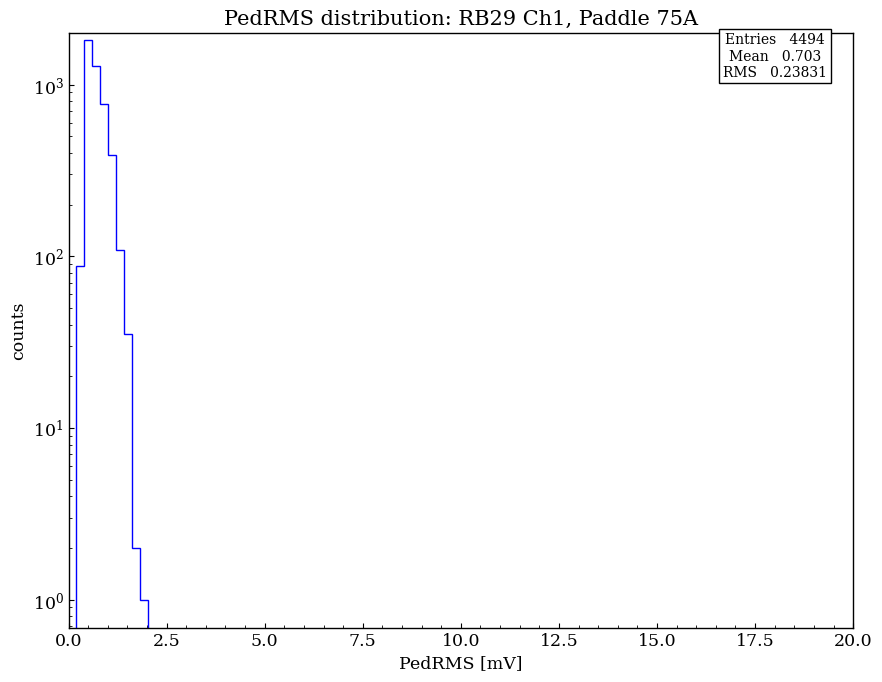

  channel 2 : Paddle 75B
    events = 4494
    mean   = 0.587
    RMS    = 0.158

  channel 3 : Paddle 77A
    events = 4814
    mean   = 0.578
    RMS    = 0.159

  channel 4 : Paddle 77B
    events = 4814
    mean   = 0.578
    RMS    = 0.157

  channel 5 : Paddle 107A
    events = 5409
    mean   = 0.593
    RMS    = 0.159

  channel 6 : Paddle 107B
    events = 5409
    mean   = 0.594
    RMS    = 0.157

  channel 7 : Paddle 105A
    events = 3508
    mean   = 0.626
    RMS    = 0.140

  channel 8 : Paddle 105B
    events = 3508
    mean   = 0.650
    RMS    = 0.140


Readout Board 31
  channel 1 : Paddle 76A
    events = 5400
    mean   = 0.576
    RMS    = 0.124

  channel 2 : Paddle 76B
    events = 5400
    mean   = 0.546
    RMS    = 0.090

  channel 3 : Paddle 78A
    events = 4967
    mean   = 0.533
    RMS    = 0.085

  channel 4 : Paddle 78B
    events = 4967
    mean   = 0.528
    RMS    = 0.079

  channel 5 : Paddle 108A
    events = 4011
    mean   = 0.551
    RMS    = 

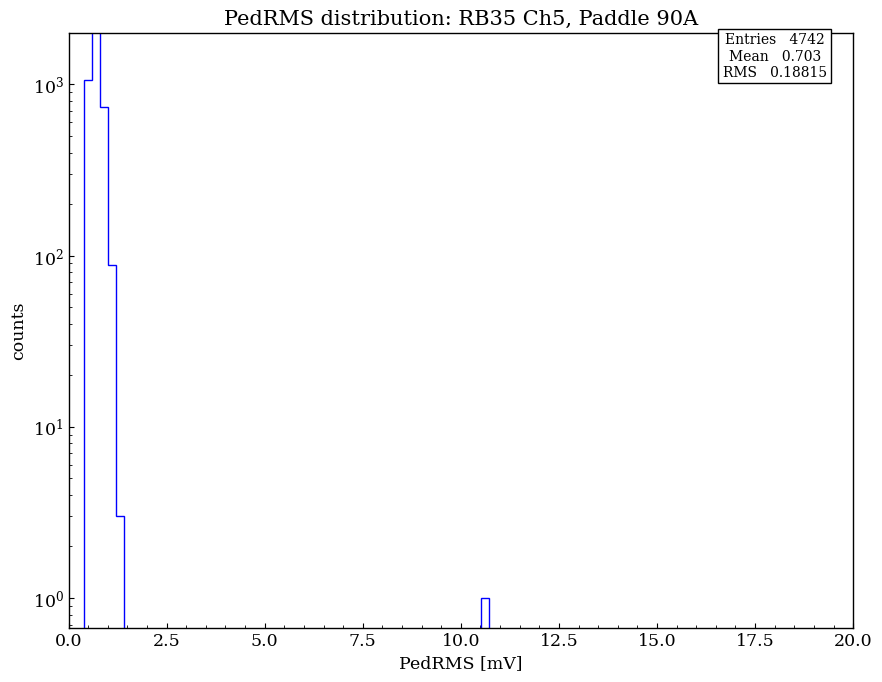

  channel 6 : Paddle 90B
    events = 4742
    mean   = 0.710
    RMS    = 0.195



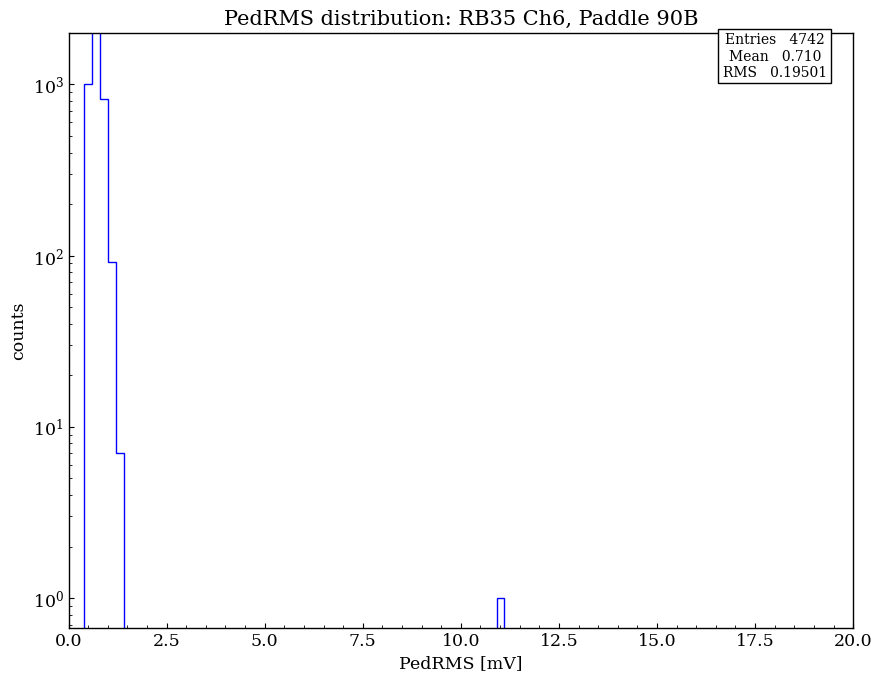

  channel 7 : Paddle 88A
    events = 4590
    mean   = 0.557
    RMS    = 0.074

  channel 8 : Paddle 88B
    events = 4590
    mean   = 0.572
    RMS    = 0.075



In [13]:
for rb in keys:
    print("\nReadout Board " + str(rb))
    for ch in range(0,8):
        
        pedRMS_list = np.array(pedrms_dict[rb][ch])
        paddle_num = paddmap[str(rb)][str(ch+1)]%1000

        # umbrella paddle requirement
        if (paddle_num > 60 and paddle_num < 109):
            
            if (paddmap[str(rb)][str(ch+1)] > 2000):
                paddle_AB = "B"
            else:
                paddle_AB = "A"

            print("  channel " + str(ch+1) + " : Paddle " + str(paddle_num) + paddle_AB)
            if len(pedRMS_list) == 0:
                print("        ! ! ! ! NO EVENTS FOR THIS CHANNEL ! ! ! !")
            print("    events = {0:d}\n".format(len(pedRMS_list)) + "    mean   = {0:.3f}\n".format(np.mean(pedRMS_list)) + "    RMS    = {0:.3f}\n".format(np.std(pedRMS_list-np.mean(pedRMS_list))))

            if (np.mean(pedRMS_list) > 0.7):
                print("        ! ! ! ! HIGH RMS ! ! ! !")
                plotroot(pedRMS_list, 0, 20, "PedRMS [mV]", "counts", "PedRMS distribution: RB" + str(rb) + " Ch" + str(ch+1) + ", Paddle " + str(paddle_num) + paddle_AB, 2000, xlo=0, log=True)



the code below prints statistics for Pedestal values for all paddles in the umbrella. also, information about the truncated distribution is printed, including number of outliers.

- if a high RMS is found (> 0.7), a warning is printed
- if many outliers are found (> 2%), a warning is printed

In [20]:
for rb in keys:
    print("\nReadout Board " + str(rb))
    for ch in range(8):
        
        paddle_num = paddmap[str(rb)][str(ch+1)]%1000

        # umbrella paddle requirement
        if (paddle_num > 60 and paddle_num < 109):
            
            if (paddmap[str(rb)][str(ch+1)] > 2000):
                paddle_AB = "B"
            else:
                paddle_AB = "A"

            ped_list = np.array(ped_dict[rb][ch])
            ped_sigma = np.std(ped_list)
            ped_mean = np.mean(ped_list)
        
            trunc1_ped = ped_list[ped_list < ped_mean+4*ped_sigma]
            trunc_ped = trunc1_ped[trunc1_ped > ped_mean-4*ped_sigma]
        
            print("  channel " + str(ch+1) + " : Paddle " + str(paddle_num) + paddle_AB)
            if (np.mean(ped_sigma) > 0.7):
                print("        ! ! ! ! HIGH RMS ! ! ! !")
            print("    PED mean, RMS       = " + str(ped_mean) +", "+ str(ped_sigma))
            print("    truncated mean, RMS = " + str(np.mean(trunc_ped)) +", "+ str(np.std(trunc_ped)))
            if ((len(ped_list)-len(trunc_ped))/len(ped_list) > 0.02):
                print("        ! ! ! ! MANY OUTLIERS ! ! ! !")
            print("    outliers            = "+ str(len(ped_list)-len(trunc_ped)))
    


Readout Board 3
  channel 1 : Paddle 65A
    PED mean, RMS       = 0.06687811, 0.38916582
    truncated mean, RMS = 0.05890712, 0.36956722
    outliers            = 22
  channel 2 : Paddle 65B
    PED mean, RMS       = -0.12877657, 0.3166024
    truncated mean, RMS = -0.13967264, 0.26482332
    outliers            = 48
  channel 3 : Paddle 63A
    PED mean, RMS       = 0.53437555, 0.31714034
    truncated mean, RMS = 0.52137977, 0.25908443
    outliers            = 51
  channel 4 : Paddle 63B
    PED mean, RMS       = 0.44405127, 0.30525008
    truncated mean, RMS = 0.4291554, 0.25344747
    outliers            = 51
  channel 5 : Paddle 61A
    PED mean, RMS       = 0.973978, 0.33828107
    truncated mean, RMS = 0.96670234, 0.27371836
    outliers            = 59
  channel 6 : Paddle 61B
    PED mean, RMS       = 0.90157086, 0.33592424
    truncated mean, RMS = 0.8930607, 0.2700565
    outliers            = 51
  channel 7 : Paddle 73A
    PED mean, RMS       = 1.3850662, 0.36205256
  

# Look at Integrated Charge distributions

the code below shows statistics for QInt distributions for each umbrella paddle end (truncated at 5 pC)
- a warning is printed, and distributions for both paddle ends are plotted, if the average value at either paddle is calculated to be less than 14 pC

*these distributions are NOT gaussian*

  plt.ylim(0,ylim)




Readout Board 3
  channel 1 : Paddle 65B
    Qint mean, RMS         = 18.277306540526734, 12.12602178572244
    # of events > 5pC      = 4014
    Qint mean, RMS          = 17.672736131582084, 12.639222013282899
    # of events > 5pC       = 4147
  channel 0 : Paddle 65A
  channel 3 : Paddle 63B
    Qint mean, RMS         = 17.12418562753375, 14.321514993299482
    # of events > 5pC      = 4230
    Qint mean, RMS          = 16.192605864760008, 11.976406521289796
    # of events > 5pC       = 4035
  channel 2 : Paddle 63A
  channel 5 : Paddle 61B
    Qint mean, RMS         = 20.10187905960837, 16.976066265494488
    # of events > 5pC      = 4555
    Qint mean, RMS          = 17.10839269336711, 16.127206168446847
    # of events > 5pC       = 4228
  channel 4 : Paddle 61A
  channel 7 : Paddle 73B
    Qint mean, RMS         = 19.93549139989744, 18.838852529478835
    # of events > 5pC      = 4681
    Qint mean, RMS          = 21.739660226854518, 22.876151760491712
    # of events > 5pC   

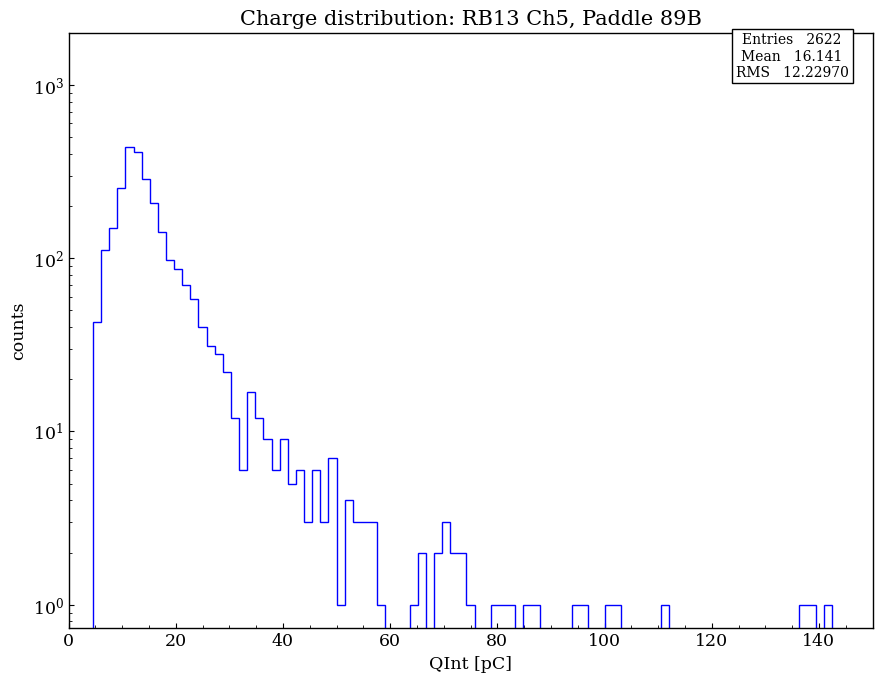

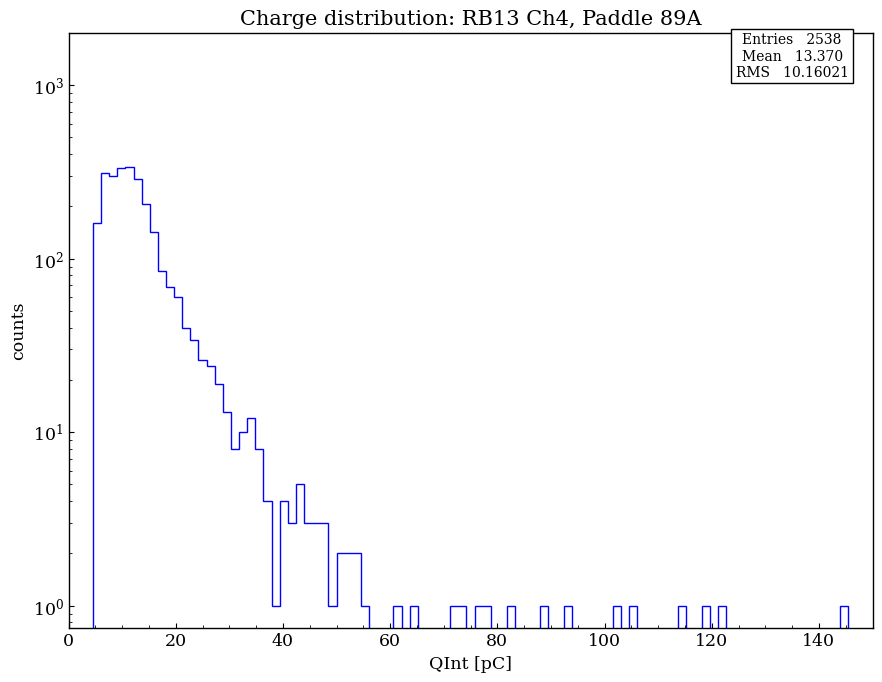

  channel 7 : Paddle 87B
    Qint mean, RMS         = 18.337744669182957, 13.287021366180566
    # of events > 5pC      = 4134
    Qint mean, RMS          = 15.28181386795044, 11.378283909210992
    # of events > 5pC       = 4000
  channel 6 : Paddle 87A

Readout Board 14
  channel 1 : Paddle 67A
    Qint mean, RMS         = 18.996200933666714, 14.695731169313506
    # of events > 5pC      = 4671
    Qint mean, RMS          = 18.58460902599952, 14.100429985319842
    # of events > 5pC       = 4777
  channel 0 : Paddle 67B
  channel 3 : Paddle 69A
    Qint mean, RMS         = 16.380319839519842, 10.851232698243887
    # of events > 5pC      = 4328
    Qint mean, RMS          = 17.703877133456146, 12.322692185435612
    # of events > 5pC       = 4202
  channel 2 : Paddle 69B
  channel 5 : Paddle 71A
    Qint mean, RMS         = 17.58328748511053, 15.506261028867407
    # of events > 5pC      = 4710
    Qint mean, RMS          = 17.587449504845566, 17.022920769397203
    # of events > 5pC

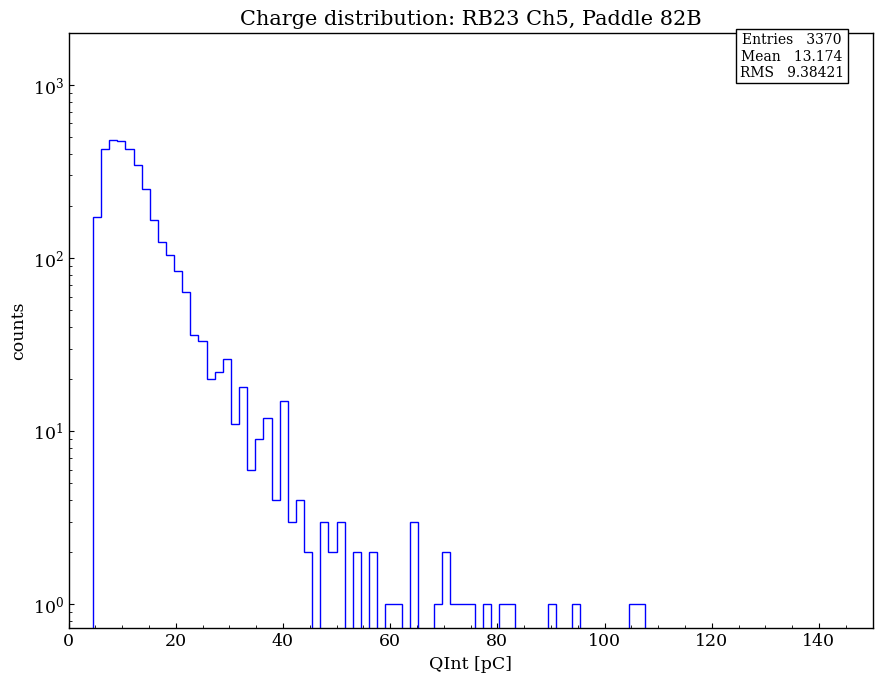

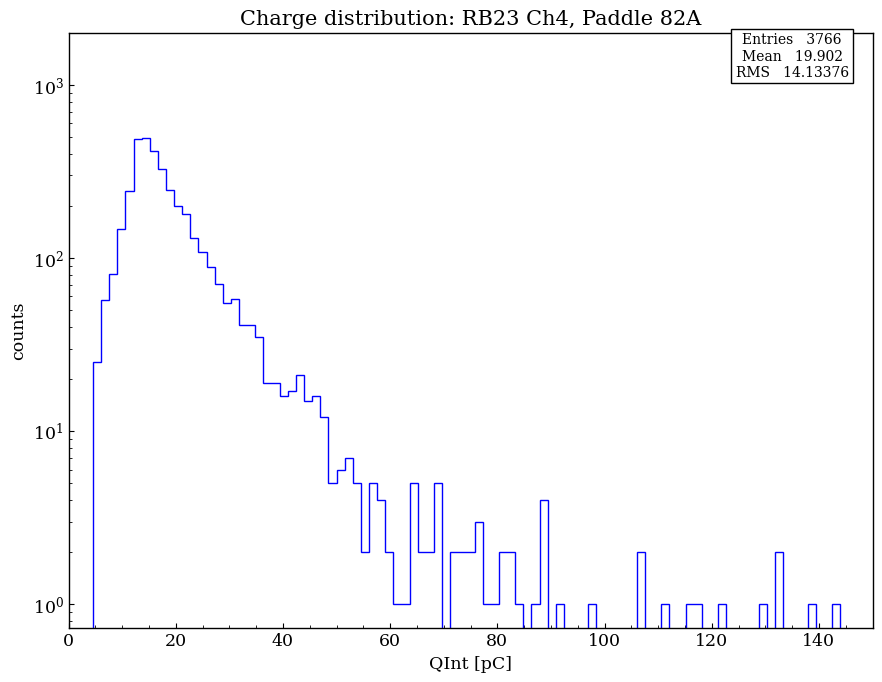

  channel 7 : Paddle 80B
    Qint mean, RMS         = 20.21020746568654, 17.056202960887298
    # of events > 5pC      = 3650
    Qint mean, RMS          = 19.41284928159424, 16.384457182725495
    # of events > 5pC       = 3529
  channel 6 : Paddle 80A

Readout Board 24
  channel 1 : Paddle 104B
    Qint mean, RMS         = 19.955170153967828, 15.10514122414218
    # of events > 5pC      = 5213
    Qint mean, RMS          = 17.420895908673604, 14.35493382233096
    # of events > 5pC       = 5184
  channel 0 : Paddle 104A
  channel 3 : Paddle 101B
    Qint mean, RMS         = 19.04964032541658, 15.359830140402638
    # of events > 5pC      = 4824
    Qint mean, RMS          = 17.605871064375066, 13.810586964644203
    # of events > 5pC       = 4754
  channel 2 : Paddle 101A
  channel 5 : Paddle 99B
    Qint mean, RMS         = 17.88979312263235, 13.731811830731472
    # of events > 5pC      = 4998
    Qint mean, RMS          = 15.802181161990838, 12.946810064871423
    # of events > 5p

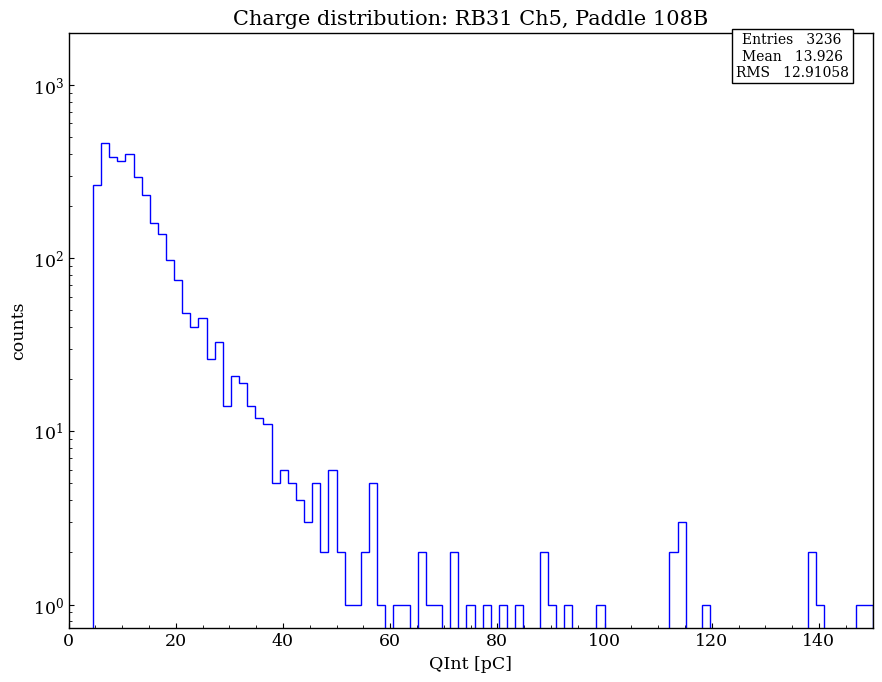

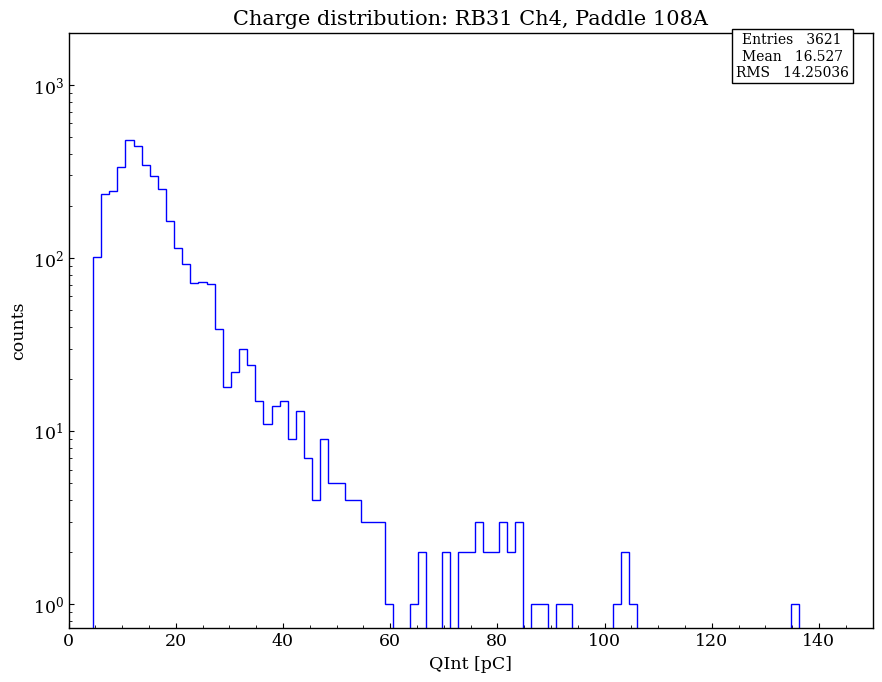

  channel 7 : Paddle 106B
    Qint mean, RMS         = 14.334927176409733, 11.198231328547793
    # of events > 5pC      = 3218
    Qint mean, RMS          = 16.21519124195067, 12.990085558628564
    # of events > 5pC       = 3239
  channel 6 : Paddle 106A

Readout Board 32
  channel 1 : Paddle 68A
    Qint mean, RMS         = 18.73886495439989, 16.497715532485035
    # of events > 5pC      = 4609
    Qint mean, RMS          = 18.10446318321892, 17.726720909426188
    # of events > 5pC       = 4657
  channel 0 : Paddle 68B
  channel 3 : Paddle 70A
    Qint mean, RMS         = 14.871968984930234, 11.884739342873763
    # of events > 5pC      = 4208
    Qint mean, RMS          = 15.643142263276571, 12.519707702574626
    # of events > 5pC       = 4070
  channel 2 : Paddle 70B
  channel 5 : Paddle 72A
    Qint mean, RMS         = 19.220493459464205, 15.109716498424167
    # of events > 5pC      = 4621
    Qint mean, RMS          = 17.95718707577921, 13.757045428758367
    # of events > 5p

In [33]:
for rb in keys:
    print("\nReadout Board " + str(rb))

    for ch in range(4):
        
        padd1 = 2*(ch+1)
        padd2 = 2*(ch+1)-1
        
        paddle_num = paddmap[str(rb)][str(padd1)]%1000

        # umbrella paddle requirement
        if (paddle_num > 60 and paddle_num < 109):
            
            if (paddmap[str(rb)][str(padd1)] > 2000):
                padd1_AB = "B"
                padd2_AB = "A"
                
                #if (paddmap[str(rb)][str(padd2)] > 2000):
                #    print("MISMATCH??")
            
            else:
                padd1_AB = "A"
                padd2_AB = "B"
                
                #if (paddmap[str(rb)][str(padd2)]  2000):
                #    print("MISMATCH??")

            padd2Q = np.array(Qcut_dict[rb][2*ch])
            padd1Q = np.array(Qcut_dict[rb][2*ch+1])

            plot=0
            
            print("  channel " + str(2*ch+1) + " : Paddle " + str(paddle_num) + padd1_AB)

            if (np.mean(padd2Q) < 14):
                print("        ! ! ! ! LOW AVG CHARGE ! ! ! !")
                plot=1
            print("    Qint mean, RMS         = " + str(np.mean(padd2Q)) +", "+ str(np.std(padd2Q)))
            print("    # of events > 5pC      = " + str(len(padd2Q)))
            
            if (np.mean(padd1Q) < 14):
                print("        ! ! ! ! LOW AVG CHARGE ! ! ! !")
                plot=1
            print("    Qint mean, RMS          = " + str(np.mean(padd1Q)) +", "+ str(np.std(padd1Q)))
            print("    # of events > 5pC       = " + str(len(padd1Q)))

            print("  channel " + str(2*ch) + " : Paddle " + str(paddle_num) + padd2_AB)
            
            if plot==1:
                plotroot(padd1Q, 0, 150, "QInt [pC]", "counts", "Charge distribution: RB" + str(rb) + " Ch" + str(2*ch+1) + ", Paddle " + str(paddle_num) + padd1_AB, 2000, xlo=0, log=True)
                plotroot(padd2Q, 0, 150, "QInt [pC]", "counts", "Charge distribution: RB" + str(rb) + " Ch" + str(2*ch) + ", Paddle " + str(paddle_num)+ padd2_AB, 2000, xlo=0, log=True)




# Look at Q vs Q plot

the code below plots QEnd2End for each umbrella paddle. *requires visually inspecting for dead channels by searching for plots hugging either axis or the origin*


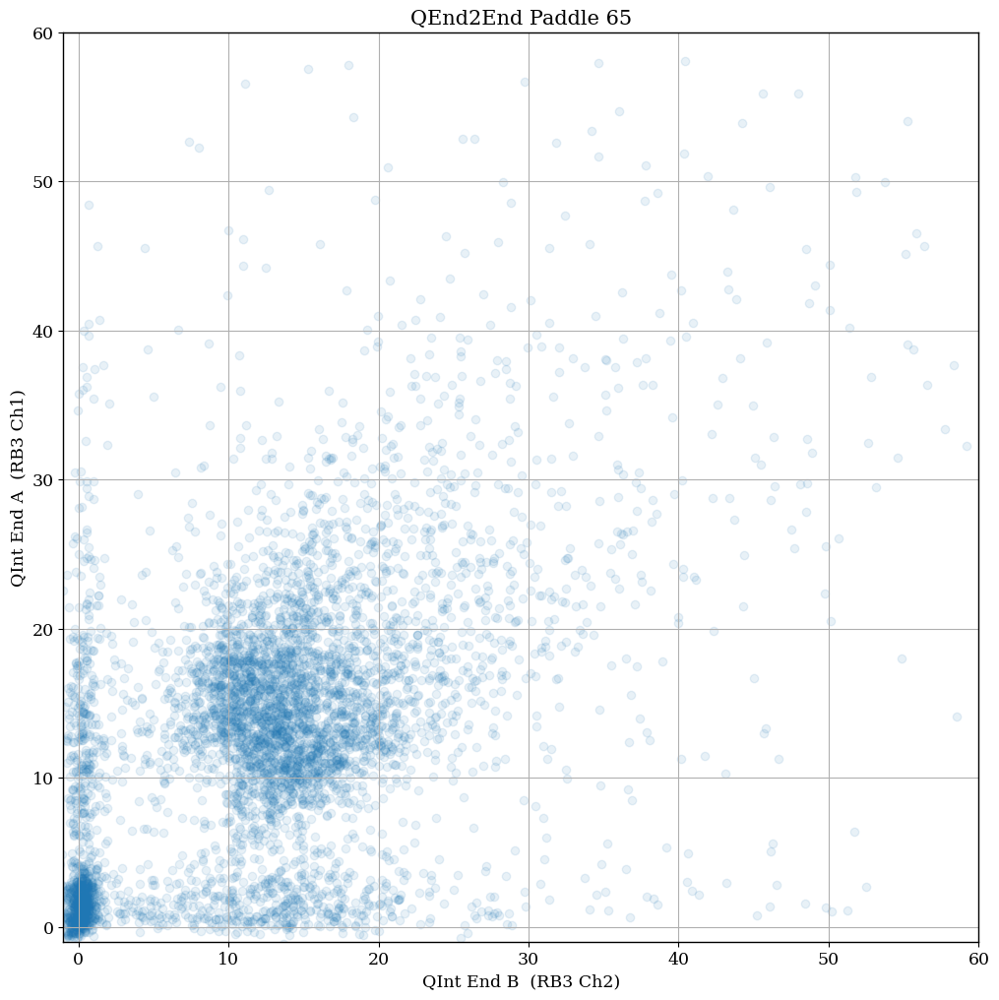

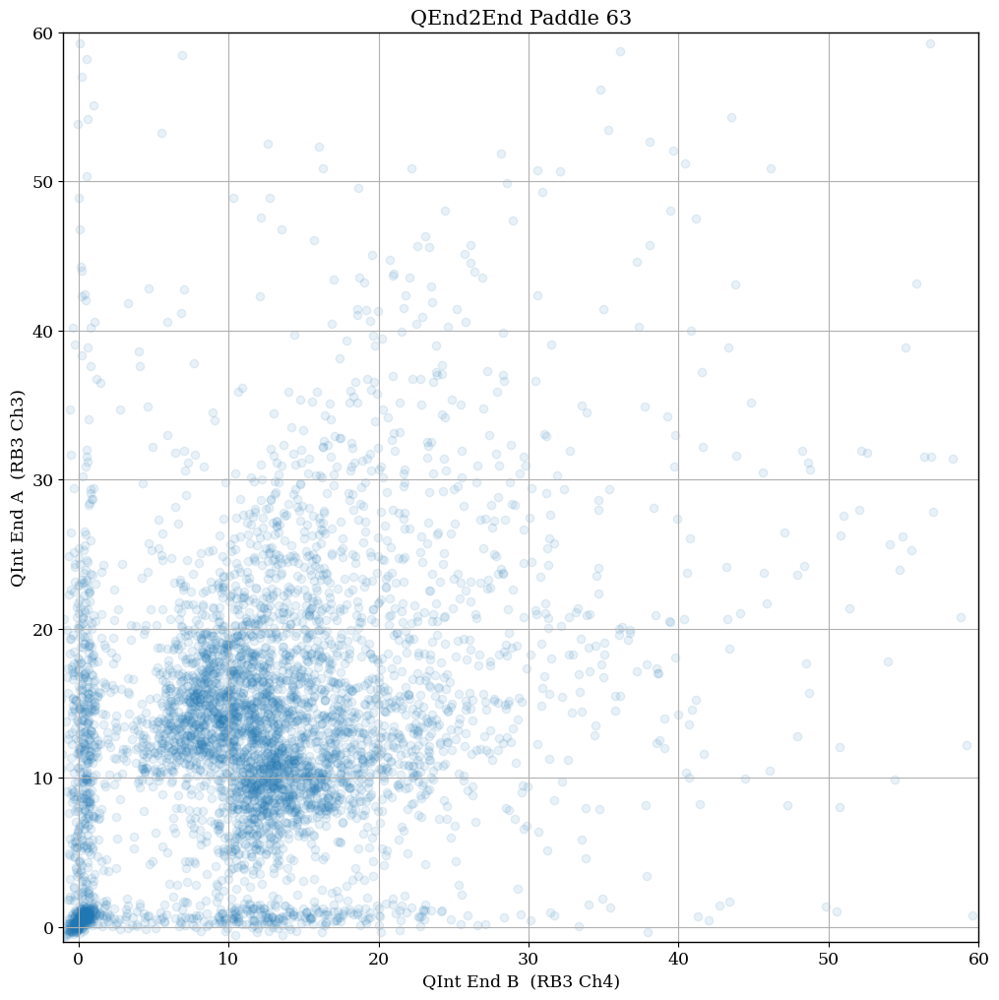

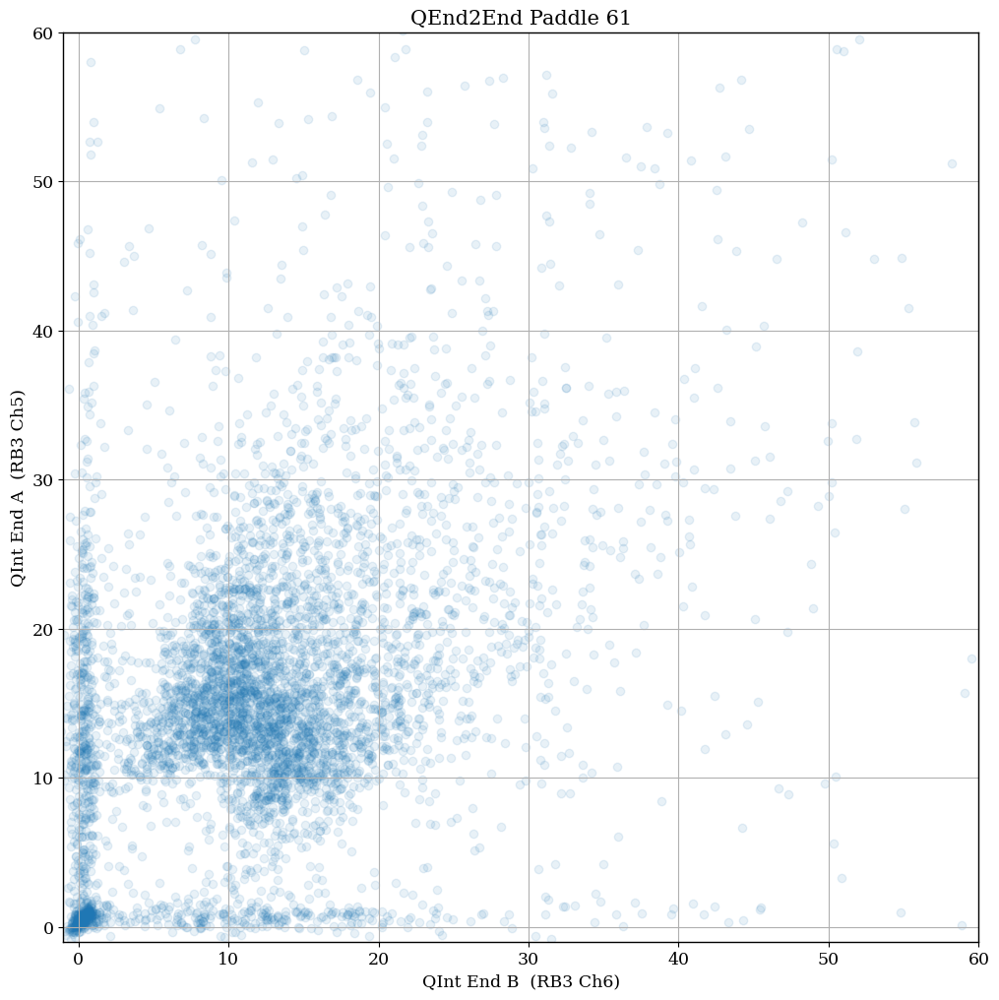

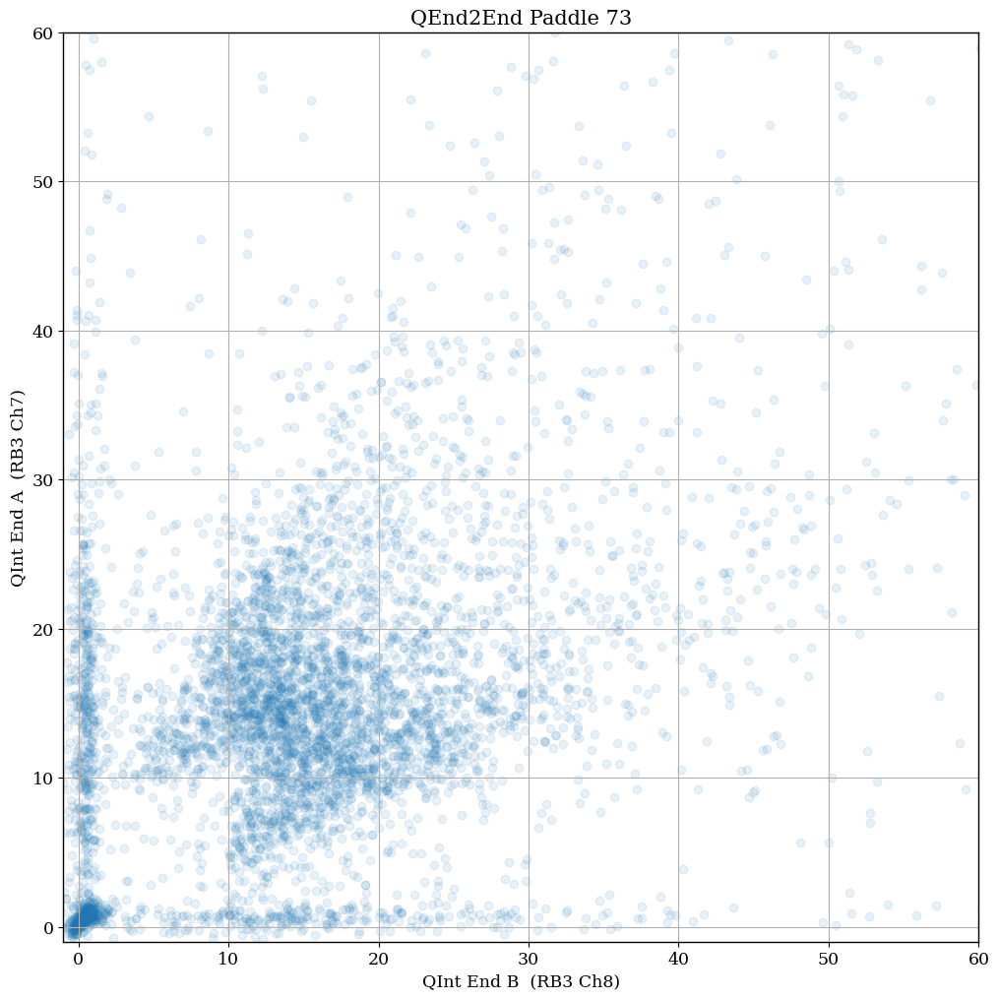

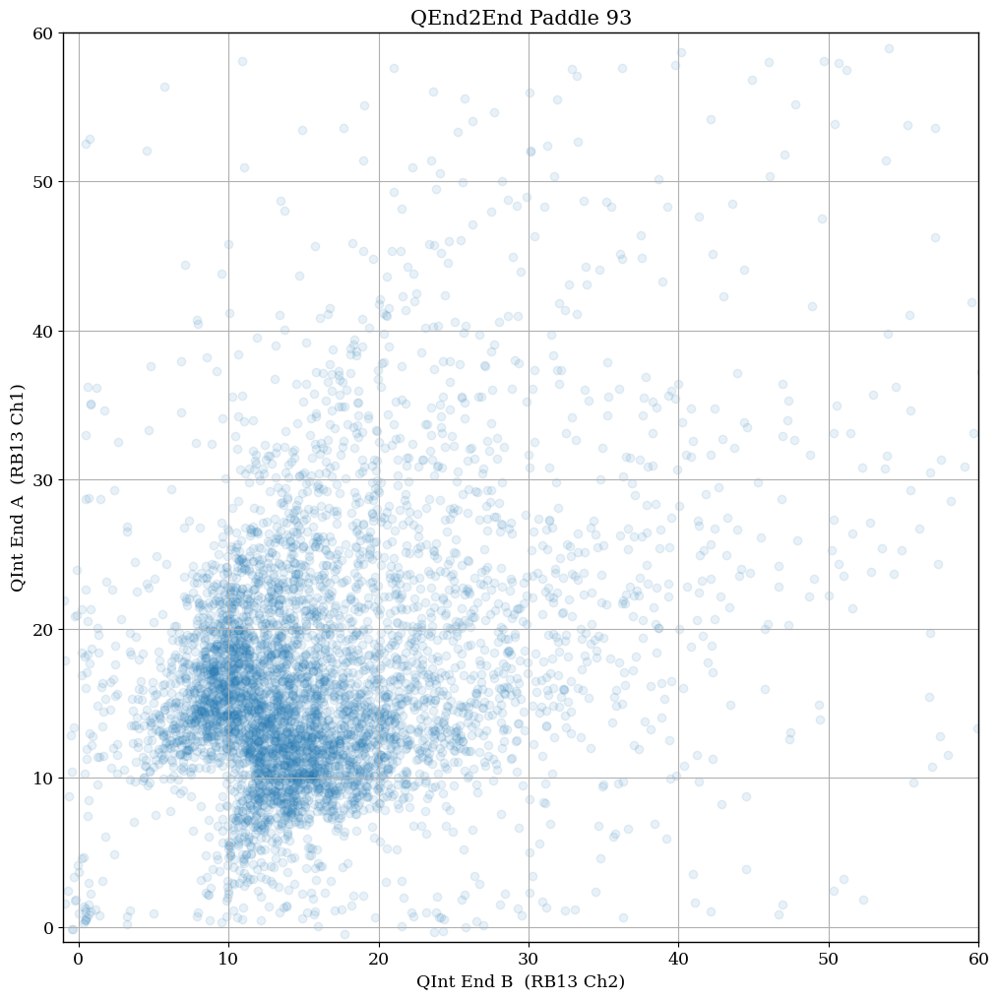

...

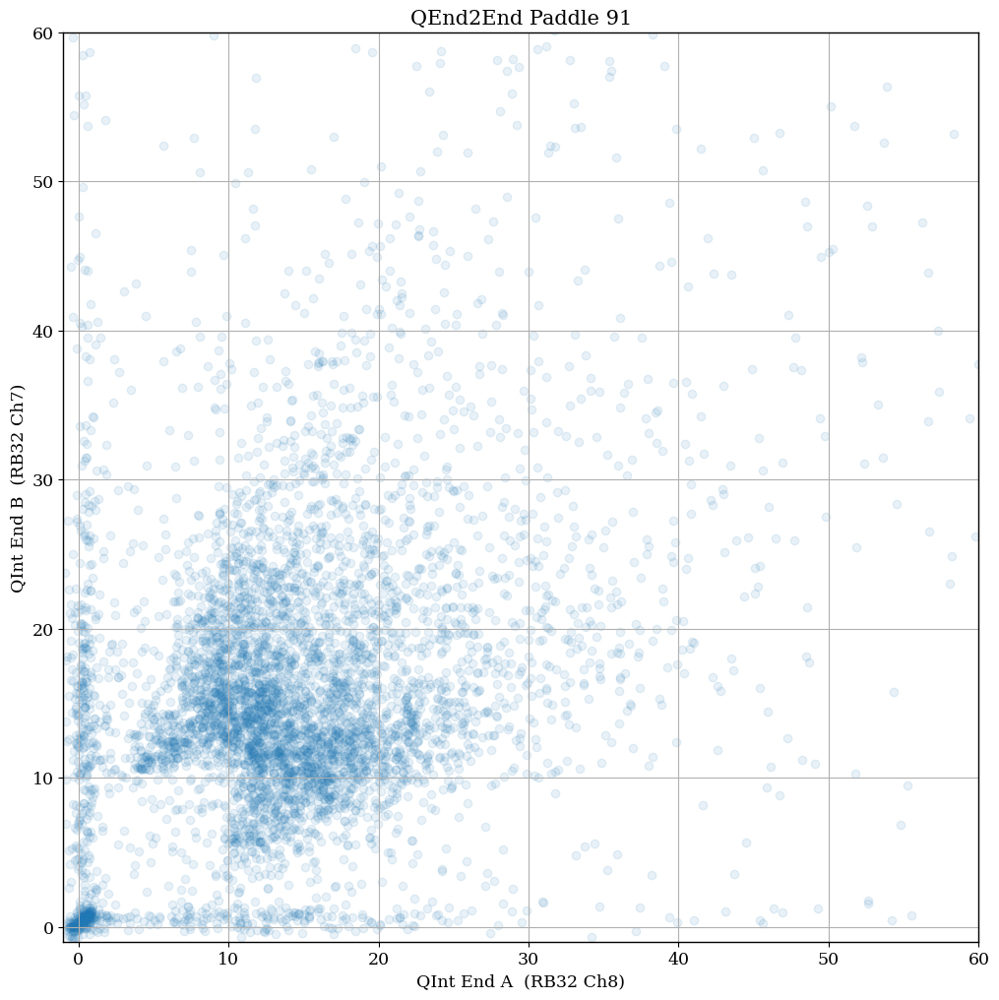

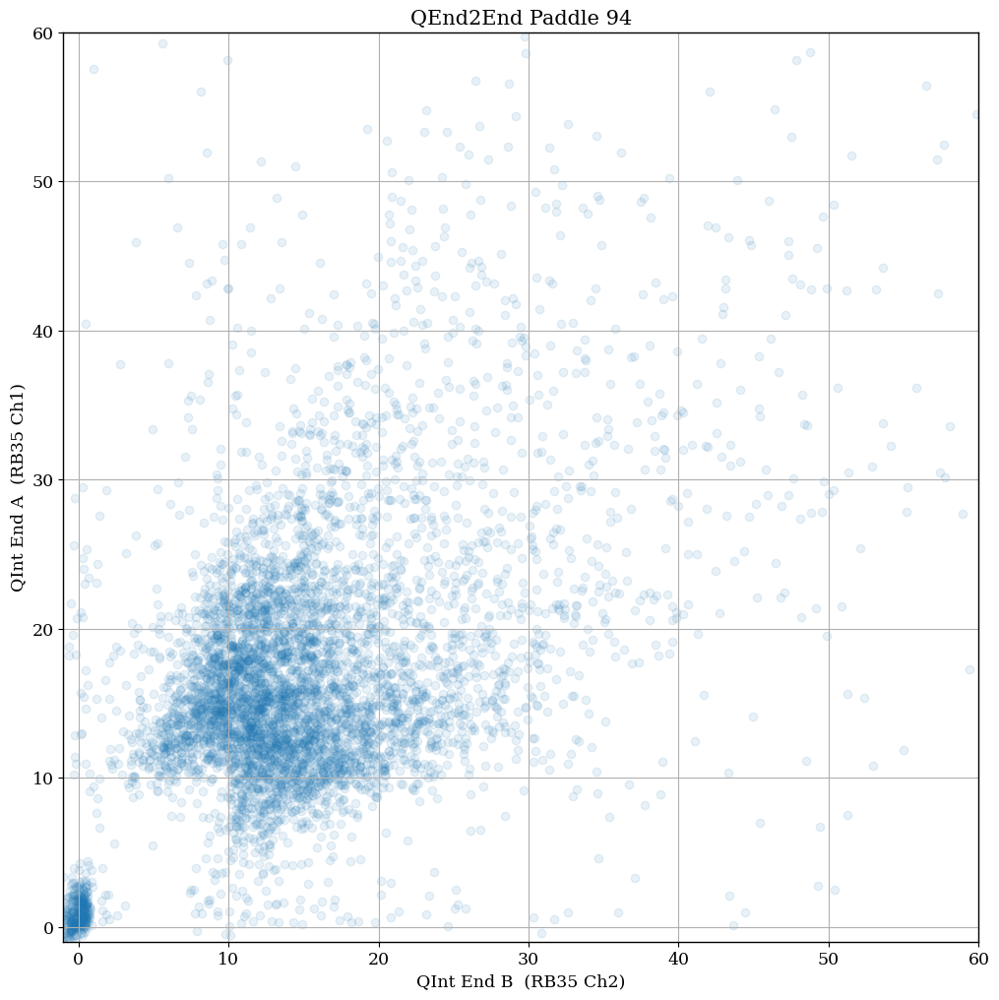

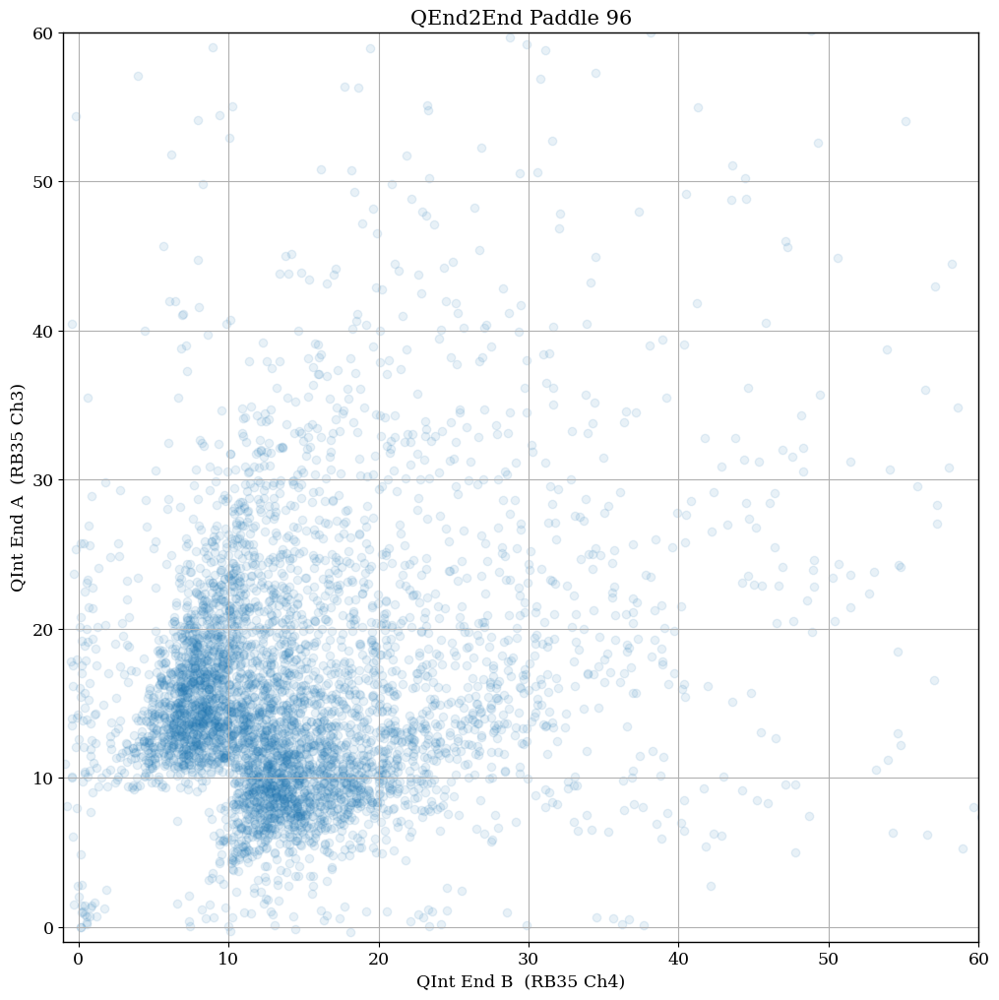

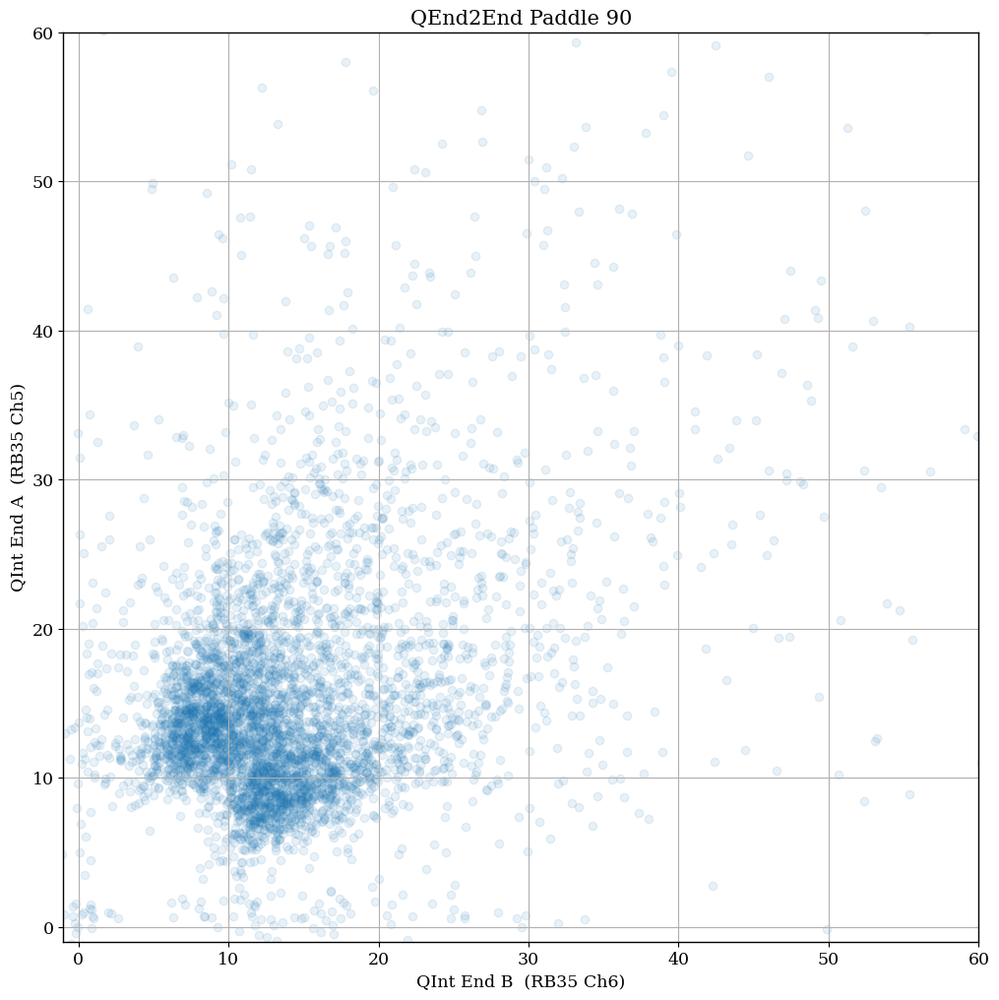

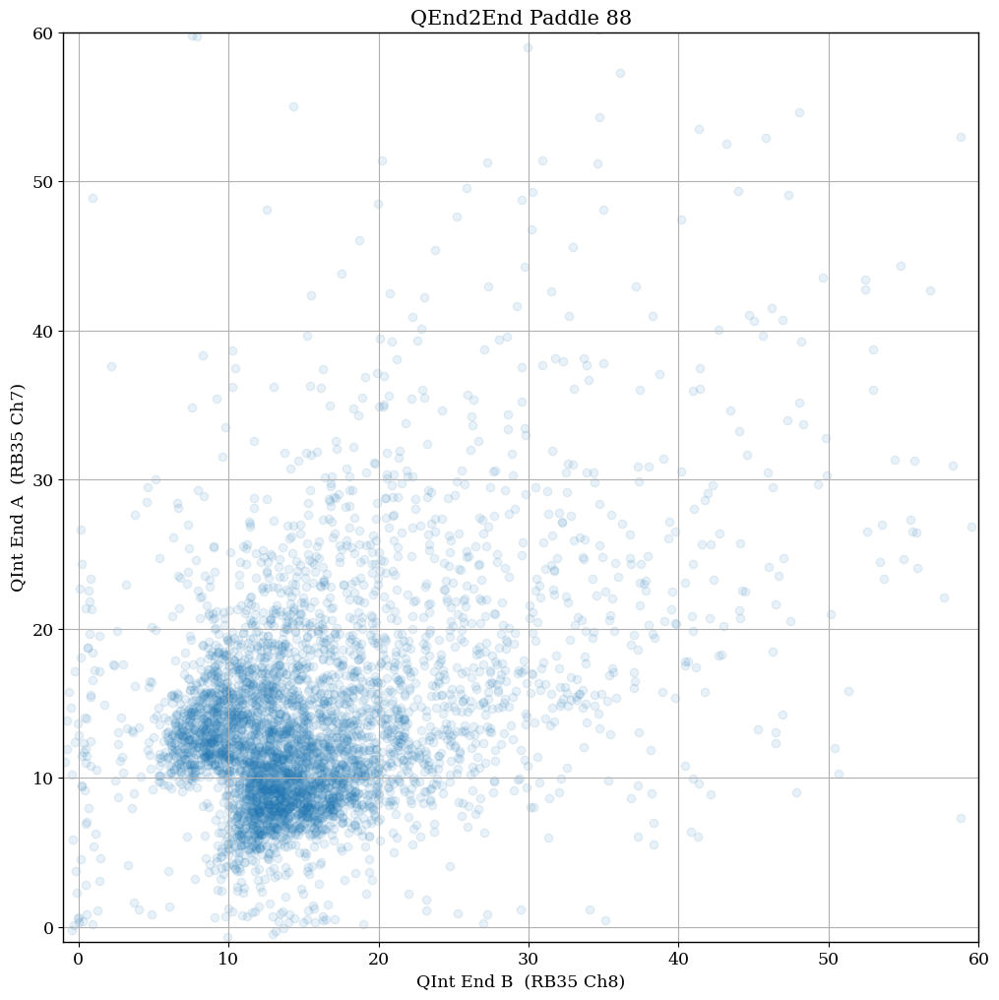

In [15]:
for rb in keys:

    for ch in range(4):
        
        padd1 = 2*(ch+1)
        padd2 = 2*(ch+1)-1
        
        paddle_num = paddmap[str(rb)][str(padd1)]%1000

        # umbrella paddle requirement
        if (paddle_num > 60 and paddle_num < 109):
            
            if (paddmap[str(rb)][str(padd1)] > 2000):
                padd1_AB = "B"
                padd2_AB = "A"
                
                #if (paddmap[str(rb)][str(padd2)] > 2000):
                #    print("MISMATCH??")
            
            else:
                padd1_AB = "A"
                padd2_AB = "B"
                
                #if (paddmap[str(rb)][str(padd2)]  2000):
                #    print("MISMATCH??")
            
            fig,ax = plt.subplots(figsize=(12,12))

            padd2Q = np.array(Q_dict[rb][2*ch])
            padd1Q = np.array(Q_dict[rb][2*ch+1])
            plt.scatter(padd1Q,padd2Q,alpha=0.1)
            plt.ylim(-1,60)
            plt.xlim(-1,60)
            plt.xlabel("QInt End " + padd1_AB + "  (RB" + str(rb) + " Ch" + str(2*(ch+1)) + ")")
            plt.ylabel("QInt End " + padd2_AB + "  (RB" + str(rb) + " Ch" + str(2*(ch+1)-1) + ")")
            plt.grid()
            plt.title("QEnd2End Paddle " + str(paddle_num))
            plt.show()